In [104]:
"""
This code is for the NIRIFUSNS project for ASTR480
Title: Near Infra-Red Integral Field Unit Spectrograph Notebook Simulation (NIRIFUSNS)
Author: Knisha Hodge :)
Started on 13 March 2025 13/3/25
Last Updated: 5/10/25
"""


'\nThis code is for the NIRIFUSNS project for ASTR480\nTitle: Near Infra-Red Integral Field Unit Spectrograph Notebook Simulation (NIRIFUSNS)\nAuthor: Knisha Hodge :)\nStarted on 13 March 2025 13/3/25\nLast Updated: 5/10/25\n'

Description:
The model spectrum is changed to emulate a target of a prescribed redshift and apparent magnitude in units of photons, a global instrument throughput pre-emptively applied. The spectrum is first resampled to mimic the templates of telluric emission and absorption before being wholly re-scaled to a specified AB magnitude using the J Band flux. The spectrum is projected along a datacube blueprint of a normalised two-dimensional gaussian point source.

Another datacube representing the sky background is initialized analogously, except that the sky is treated as an extended source spanning the entire field of view rather than a point source. This is combined with the datacube of the target before the transmission is applied to each image of the wavelength array. Electronic and statistical effects are simulated by adding a third cube of dark current, then a random realisation is generated by replacing each original value in the datacube with a random sample drawn from a Poisson distribution parameterized by that value. Finally, a blanket randomly-realised read error cube was added to produce a simulated raw exposure.

To recover the spectrum from the cube, another simulated raw exposure sans target is generated, then subtracted from the target datacube. The sky correction leaves behind scarring called noise. The mock spectrum is derived by collapsing the datacube into one dimension (all spaxels are summed), then rebinned to fit the simulated instrument resolution. The error array is generated under the idealistic assumption that an exposure is representative of the parent population, the read error is added in quadrature to both the sky-subtracted datacube and the sky background datacube separately,the two cubes are combined, collapsed to one dimension, and rebinned to fit the simulated instrument resolution.

The signal to noise ratios of specific photometric bands can be calculated by integrating the exposures over that band to derive the counts, where the photometric bands are roughly approximated as rectangular.

$$
\text{SNR} = \frac{N_{\gamma}}{\sqrt{N_{\gamma} + 2 \cdot \text{Sky}N_{\gamma}}}
$$

To run PyQSOfit, the wavelength array is rebinned into log space, and the spectral and error arrays are converted from counts to CGS units of energy flux. Additionally, prominent water absorption features, specifically where the transmission dips below 70%, are masked out of the data. However, PyQSOfit likes to linearly interpolate through these sections, which unbalances the fitting. PyQSOfit then performs least squares fitting to determine continuum and emission line parameters. For these quasars, the following adjustments to the fitting model were done:

Removed Host Galaxy

Removed Dust Extinction 

Remove 3rd-order Polynomial Continuum Fitting

Remove Excess Broad Gaussian Components for the H-beta and OIII Line Fits.


In [105]:
# ─── Standard Library ──────────────────────────────────────────────────────────
import os, sys, glob, time, timeit, warnings
from IPython.display import clear_output

# ─── Scientific Computing ──────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# ─── Astropy Core ──────────────────────────────────────────────────────────────
import astropy.units as u
from astropy.constants import h, c
from astropy.io import fits
from astropy.table import Table
from astropy.modeling.models import Gaussian2D
from astropy.convolution import (
    Gaussian1DKernel,
    Gaussian2DKernel,
    convolve_fft
)

# ─── Spectral Analysis ─────────────────────────────────────────────────────────
from specutils import Spectrum1D
from specutils.manipulation import FluxConservingResampler
resampler = FluxConservingResampler()

# ─── Photometry ────────────────────────────────────────────────────────────────
from photutils.aperture import CircularAperture, aperture_photometry

# ─── External Packages ─────────────────────────────────────────────────────────
from pyqsofit.PyQSOFit import QSOFit
import lmfit  # optional: for model fitting
import emcee  # optional: for MCMC sampling

# ─── Environment Setup ─────────────────────────────────────────────────────────
%matplotlib inline
warnings.filterwarnings("ignore")
sys.path.append('../')
QSOFit.set_mpl_style()
import pyqsofit

In [106]:
# ——————————————————————
# Spatial Configuration of the IFU Spectrograph
# ——————————————————————
SPATIAL_X = 10
SPATIAL_Y = 10
y0, x0 = SPATIAL_Y // 2, SPATIAL_X // 2  # Center coordinates; for drawing out the middle spaxel

# ——————————————————————
# Spectral Range & Resolution
# ——————————————————————
NIR_MIN, NIR_MAX = 800, 2500  # nm: Spectrograph range
LINE_RESOLVING_POWER = 1000   # Spectral resolving power
IMAGE_RESOLVING_POWER = 300   # PSF resolving power
EFFICIENCY = 0.25             # Instrumental efficiency

# ——————————————————————
# Wavelength Sampling
# ——————————————————————
WAVELENGTH_CHANNELS = int(np.log(NIR_MAX / NIR_MIN) * LINE_RESOLVING_POWER)
loglam = np.linspace(np.log(NIR_MIN), np.log(NIR_MAX), WAVELENGTH_CHANNELS)
CHANNELS = np.exp(loglam)  # Logarithmic wavelength array

# ——————————————————————
# Telescope & Observation Parameters
# ——————————————————————
COLLECTION_AREA = 39730       # cm²: 2.3m telescope
MIRROR_DIAMETER = 2.3         # meters
SKY_APERTURE = 12.56          # arcsec²: π × (2 arcsec radius)²
INTEGRATION_TIME = 3600       # seconds
REDSHIFT = 2.5                # Applied to model spectra

# ——————————————————————
# Noise & Error Parameters
# ——————————————————————
DARK_CURRENT_ERR = 0.001      # Near-zero signal
READ_NOISE_ERR = 5            # Sampling error

# ——————————————————————
# Physical Constants (from astropy)
# ——————————————————————
c = c.value  # m/s: Speed of light
h = h.value  # J·s: Planck constant

# ——————————————————————
# File System Paths (Knisha's local setup)
# ——————————————————————
sources_dir = "/home/users/kho108/Documents/ASTR480/"

# ——————————————————————
# Plotting Flags
# ——————————————————————
PLOTTING = False
PLOT_LAST_ONLY = False


In [107]:
def plot(x, y, x_label, y_label, title, caption = None, redshift = None):
    """
    Only plots if PLOTTING is True.
    Plots a spectral dataset with optional annotations and zoomed-in view.

    Parameters:
    - x (array-like): The x-axis data, typically representing wavelength or frequency.
    - y (array-like): The y-axis data, typically representing intensity or flux.
    - x_label (str): Label for the x-axis.
    - y_label (str): Label for the y-axis.
    - title (str): Title of the main plot.
    - caption (str, optional): Caption text to be displayed below the plot (currently commented out).
    - redshift (float, optional): If provided, overlays a vertical line at the expected observed H-beta wavelength.

    Behavior:
    - Generates two plots:
        1. Full spectrum with optional redshift annotation.
        2. Zoomed-in view of the J-band region (x-axis between 1.1 and 1.4) with a horizontal reference line.
    - Applies consistent styling including gridlines, axis labels, and tick formatting.
    """
    if PLOTTING:
        plt.figure()
        plt.plot(x, y, label="spectrum", color='black',linewidth=1)
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(title)
        # plt.axhline(32457, color='blue')

        # plt.text(0.5, -0.12, caption, ha='center', va='top', fontsize=10, transform=plt.gca().transAxes)
        if redshift != None:
            lambda_obs = 0.486 * (1 + redshift) #Micrometers
            plt.axvline(x=lambda_obs, color="red", linestyle="--", label=f"Expected observed H-beta z={redshift:.2f}") if redshift != None else None

        # plt.savefig("original_spec.png", dpi=300)
        plt.show()

        plt.figure()
        plt.plot(x, y, label="spectrum", color='black',linewidth=1)
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)
        plt.xlim((1.1,1.4))
        # plt.ylim((0,553573))
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title('j band section zoom in')
        plt.axhline(y=37263, color='blue')
        
def interpolate_tool(wave_nm, photon_fluxes, new_sampling, instrument_blurring = False):
    """
    Interpolates a photon flux spectrum onto a new wavelength grid, with optional instrument blurring.

    Parameters:
    - wave_nm (array-like): Original wavelength sampling in nanometers.
    - photon_fluxes (array-like): Photon flux values corresponding to the original wavelength grid.
    - new_sampling (array-like): Target wavelength grid for interpolation. Typically initialized using ESO's grid,
      and later refined to match simulated instrument specifications.
    - instrument_blurring (bool, optional): If True, applies Gaussian convolution to simulate instrument resolution
      effects. Defaults to False.

    Returns:
    - convolved_spectra_2d (array-like): Interpolated (and optionally blurred) photon flux spectrum on the new grid.

    Notes:
    - Uses `Spectrum1D` for spectral representation and resampling.
    - If blurring is enabled, a Gaussian kernel is constructed based on the instrument's resolving power and applied
      via FFT convolution to mimic instrumental broadening.
    """
    # Interpolate flux transmission to match spectrum wavelength grid
    spec = Spectrum1D(spectral_axis=wave_nm * u.nm, flux=photon_fluxes * u.photon)
    resampled_spec = resampler(spec, new_sampling * u.nm)
    interpolated_array = resampled_spec.flux.value

    # Define Gaussian kernel based on instrument resolution
    if instrument_blurring:
        lambda_ref = np.median(CHANNELS)
        FWHM = lambda_ref / LINE_RESOLVING_POWER
        sigma = FWHM / (2 * np.sqrt(2 * np.log(2)))  # Convert FWHM to sigma

        # Convolve with instrumental profile
        kernel = Gaussian1DKernel(stddev=sigma / np.median(np.diff(CHANNELS)))
        convolved_spectra_2d = convolve_fft(interpolated_array, kernel)
    else:
        convolved_spectra_2d = interpolated_array

    return convolved_spectra_2d

def calculate_j_band_mag(flam, wave, redshift = REDSHIFT, new_mag = None, integration_time = INTEGRATION_TIME):
    """
    Calculates the AB magnitude in the J-band from a rest-frame flux density spectrum and optionally rescales it 
    to match a target magnitude. Converts the energy spectrum into photon fluxes for further simulation.

    Parameters:
    - flam (array-like): Flux density in units of erg s⁻¹ cm⁻² Å⁻¹ arcsec⁻².
    - wave (array-like): Wavelength array in microns.
    - redshift (float, optional): Redshift value used for rest-frame correction. Defaults to global REDSHIFT.
    - new_mag (float, optional): Target AB magnitude. If provided, rescales the spectrum to match this value.
    - integration_time (float, optional): Exposure time in seconds. Defaults to global INTEGRATION_TIME.

    Returns:
    - photon_fluxes (array-like): Photon counts per spectral bin after applying instrument parameters.
    - disp (array-like): Spectral dispersion in microns.
    """
    disp = np.roll(wave, -1) - wave # Calculate the dispersion in microns
    disp[-1] = disp[-2]  # handle wrap-around

    # Energy per pixel [erg s^-1 cm^-2 pixel^-1]
    energy = flam * disp * 1e4  # disp in μm → Å

    # J-band window: center ± half-width
    weff, width = 1.25, 0.30  # microns
    w1, w2 = weff - 0.5 * width, weff + 0.5 * width
    use = np.where((wave >= w1) & (wave <= w2))

    # AB magnitude in J-band
    Total = np.sum(energy[use])  # erg s^-1 cm^-2 arcsec^-2
    flam_band = Total / ((w2 - w1) * 1e-6)  # erg s^-1 cm^-2 m^-1 arcsec^-2
    fnu = flam_band * (weff * 1e-6)**2 / c  # erg s^-1 cm^-2 Hz^-1 arcsec^-2
    mag = -2.5 * np.log10(fnu) - 48.6

    print(f"original mag {mag:.3f}") if PLOTTING else None

    if new_mag != None:
        # Compute the scaling factor to adjust the magnitude
        scale_factor = 10 ** ((mag - new_mag) / 2.5)
        energy *= scale_factor
        Total = np.sum(energy[use])  # erg s^-1 cm^-2 arcsec^-2
        flam_band = Total / ((w2 - w1) * 1e-6)  # erg s^-1 cm^-2 m^-1 arcsec^-2
        fnu = flam_band * (weff * 1e-6)**2 / c  # erg s^-1 cm^-2 Hz^-1 arcsec^-2
        mag = -2.5 * np.log10(fnu) - 48.6
        print(f"NEW TARGET AB magnitude in J-band: {mag:.3f}") if PLOTTING else None

    plot(wave, flam, 'Wavelength [μm]',r'$F_{\lambda}$ [erg s$^{-1}$ cm$^{-2}$ Å$^{-1}$ arcsec$^{-2}$]', "Energy Flux (erg units)")
    plot(wave, energy, 'Wavelength [μm]',r'Energy per pixel [erg s$^{-1}$ cm$^{-2}$ arcsec$^{-2}$]', "Energy per Pixel")
    plot(wave[use], energy[use], 'Wavelength [μm]',r'Energy [erg s$^{-1}$ cm$^{-2}$ pixel$^{-1}$ arcsec$^{-2}$]', 'J-band Segment')

    print(f"AB magnitude in J-band: {mag:.3f}") if PLOTTING else None

    #Convert energy perpixel ([erg s^-1 cm^-2 pixel^-1) into photons angstrom^-1
    photon_fluxes = energy/(disp*1e-6)  #(pixel^-1 -> m^-1) [erg s^-1 cm^-2 m^-1]
    photon_fluxes = photon_fluxes * 1e-7  #(erg-> joule) [erg s^-1 cm^-2 m^-1]
    photon_fluxes = photon_fluxes*(wave*1e-6)/(h*c)  #(wave micron-> m, joule-> photons) [photon s^-1 cm^-2 m^-1]
    photon_fluxes = photon_fluxes * COLLECTION_AREA * integration_time #(get rid of per second, per cm^2) [photon m^-1]
    photon_fluxes = photon_fluxes * (wave*1e-6/LINE_RESOLVING_POWER) #(get rid of per m) [photon]
    photon_fluxes = photon_fluxes * EFFICIENCY #apply global efficiency [photon]

    return photon_fluxes, disp



In [108]:
class SpectraMaker:
    """Spectra Maker: Class which builds the perfect model of the spectra"""
    def __init__(self):
        self.spectra = np.full((WAVELENGTH_CHANNELS, SPATIAL_Y, SPATIAL_X), fill_value=0, dtype = np.float64)
        self.telluric_filename = "skytable.fits"

    def point_source(self, channels_num):
        """
        Generates a 2D Gaussian point source model across multiple spectral channels.

        Parameters:
        - self (object): Instance of the SpectraMaker class.
        - channels_num (int): Number of spectral channels to simulate.

        Returns:
        - spectra_blueprint (ndarray): A 3D array of shape (channels_num, SPATIAL_Y, SPATIAL_X) representing 
        the spatial distribution of a normalized point source across all channels.
        """
        FWHM = np.median(channels_num) / IMAGE_RESOLVING_POWER
        sigma = FWHM / (2 * np.sqrt(2 * np.log(2)))  # Convert FWHM to sigma
        # print("FULL WIDTH HALF MAX",FWHM)

        ny, nx = SPATIAL_Y, SPATIAL_X
        y, x = np.mgrid[0:ny, 0:nx]

        # Choose fractional center position (can be adjusted)
        x0 = (nx - 1) / 2.0
        y0 = (ny - 1) / 2.0

        gaussian_model = Gaussian2D(amplitude=1.0, x_mean=x0, y_mean=y0,
                                    x_stddev=sigma, y_stddev=sigma)
        kernel = gaussian_model(x, y)
        kernel /= kernel.sum()  # Normalize to unit integral

        self.spectra_blueprint = np.full((channels_num, SPATIAL_Y, SPATIAL_X), fill_value=0, dtype = np.float64)
        for channel in range(channels_num):
            self.spectra_blueprint[channel] = kernel.copy()
        return self.spectra_blueprint

    def source_spectra(self, source_filename, magnitude_2, redshift = REDSHIFT, integration_time = INTEGRATION_TIME):
        """
        Generates a 3D spectral cube of a point source using input spectral data and observational parameters.

        Parameters:
        - source_filename (str): Filename of the source spectrum. Supported formats: `.fits` or `.txt`.
            - `.fits`: Assumes wavelength and flux are stored in HDU 1 under columns "wavelength" and "flux".
            - `.txt`: Assumes two-column ASCII format with wavelength in Ångströms and flux in erg s⁻¹ cm⁻² Å⁻¹.
        - magnitude_2 (float): Target AB magnitude in the J-band for flux rescaling.
        - redshift (float, optional): Redshift applied to the source spectrum. Defaults to global REDSHIFT.
        - integration_time (float, optional): Exposure time in seconds. Defaults to global INTEGRATION_TIME.

        Returns:
        - target_spectra_cube (ndarray): A 3D array of shape (channels, SPATIAL_Y, SPATIAL_X) representing the 
        spatially projected and flux-scaled spectral cube of the source.
        """
        f = os.path.splitext(source_filename)[1].lower()

        if f == ".fits":
            with fits.open(sources_dir + source_filename) as file:
                data = file[1].data
                wavelengths, fluxes = data["wavelength"] , data["flux"]
        
        elif f == ".txt":
            # print("standard star file")
                    #Extract the data from the file -- data is wavelengths in Angstroms (one entry every 0.2 angstrom) and fluxes in erg cm^-2 s^-1 Angstrom^-1
            with open(sources_dir + source_filename, 'r') as file:
                wavelengths, fluxes = zip(*(map(float, line.split()) for line in file)) 
            
        else: 
            print("Unknown file type.")

        # #Convert to NumPy arrays for easier manipulation
        wavelengths, fluxes = np.array(wavelengths), np.array(fluxes)  # 'flam' is in erg cm^-2 s^-1 Å^-1
        wavelengths_nm = wavelengths * 0.1  #from angstrom to nm

        plot(wavelengths*1e-4, fluxes, r'Wavelengths [µm]', r'$F_{\lambda}$ [erg s$^{-1}$ cm$^{-2}$ Å$^{-1}$]', " ")

        # Add redshift to the spectrum object
        wavelengths_nm = wavelengths_nm * (1 + redshift)

        #interpolate/resample and convolve with a 1d gaussian based on ESO's sampling
        with fits.open(sources_dir + self.telluric_filename) as hdul:
            eso_data = hdul[1].data  # Access table in HDU 1
        self.eso_sampling = eso_data['LAM']
        fluxes = interpolate_tool(wavelengths_nm, fluxes, self.eso_sampling)
    
        #Rescale the AB mag (at rest wavelenghts)
        photons, disp = calculate_j_band_mag(fluxes, self.eso_sampling*1e-3, redshift, magnitude_2, integration_time=integration_time)

        #project the realised 2d spectrum along the 3d IFU array
        target_spectra_cube = self.point_source(len(self.eso_sampling)) * photons[:, np.newaxis, np.newaxis]

        return target_spectra_cube
    
    def slice_cube(self, spectra, caption, wavelength = WAVELENGTH_CHANNELS // 2):
        """
        Displays two spatial slices from a 3D spectral cube at selected wavelengths.

        Parameters:
        - spectra (ndarray): 3D data cube (channels, Y, X).
        - caption (str): Text label for the plot.
        - wavelength (int): Central slice index (default: middle channel).
        """

        if PLOTTING:
            # slice_2d = spectra[wavelength, :, :]
            print("\n",caption)

            slice1 = spectra[wavelength, :, :]
            slice2 = spectra[int(wavelength + wavelength * 0.25), :, :]

            fig, axes = plt.subplots(1, 2, figsize=(12, 5))

            axes[0].imshow(slice1, cmap=cm.gray, vmin=0, vmax=slice1.max())
            axes[0].set_title(f'Slice at wavelength {CHANNELS[wavelength]:.0f} nm')
            fig.colorbar(axes[0].images[0], ax=axes[0], orientation='vertical')

            axes[1].imshow(slice2, cmap=cm.gray, vmin=0, vmax=slice2.max())
            axes[1].set_title(f'Slice at wavelength {CHANNELS[int(wavelength + wavelength * 0.25)]:.0f} nm')
            fig.colorbar(axes[1].images[0], ax=axes[1], orientation='vertical')
            plt.tight_layout()
            plt.show()

            if PLOT_LAST_ONLY:
                clear_output()




In [109]:
class MeatGrinder:
    """Meat Grinder: Class which handles the minutae of contaminating the spectra with sky glow, telluric absorption, dark current and read noise"""
    def __init__(self):
        self.spectra_maker = SpectraMaker()
    
    def telluric_absorption(self, spectra, telluric_filename):
        """
        Applies telluric absorption to a spectral cube and generates a wavelength mask for high transmission regions.

        Parameters:
        - spectra (ndarray): 3D spectral cube (channels, Y, X).
        - telluric_filename (str): FITS file containing atmospheric transmission data.

        Returns:
        - spectra (ndarray): Modified spectral cube with telluric absorption applied.
        """
        # Add telluric absorption effects
        with fits.open(sources_dir + telluric_filename) as hdul:
            data = hdul[1].data  # Access table in HDU 1
            
        #Interpolate the absorption effect of the atmosphere to the instrument resolution
        telluric_absorption = data["trans"]
        # telluric_absorption = interpolate_tool(data["lam"], data["trans"])

        # Apply to spectrum
        for wavelength in range(len(spectra[:,0,0])):
            spectra[wavelength] = spectra[wavelength] * telluric_absorption[wavelength]

        #develop a water absoprtion mask for better continuum fitting
        self.absorption_simulated_binning = interpolate_tool(data["lam"], telluric_absorption, CHANNELS, instrument_blurring = True)
        mask_limit = 0.7
        self.absorption_mask = self.absorption_simulated_binning > mask_limit  # Mask for wavelengths with absorption > 10%

        if PLOTTING:
            # plt.figure(figsize=(16, 10)) #big
            plt.plot(CHANNELS, self.absorption_simulated_binning, color='black', linewidth=0.5)
            plt.xlabel(r'Wavelength ($\mathrm{\AA}$)')
            plt.ylabel('Transmission')
            plt.title(f"Simulated Instrument Binning of Telluric Absorption with mask limit > {mask_limit}")
            
            #plots the mask as coloured stripes
            for i in range(len(CHANNELS)-1):  # Loop through each segment between x points
                if self.absorption_mask[i]:
                    plt.axvspan(CHANNELS[i], CHANNELS[i+1], color='green', alpha=0.2)  # Green stripes where True
                else:
                    plt.axvspan(CHANNELS[i], CHANNELS[i+1], color='red', alpha=0.2)  # Red stripes where False

            plt.show()


        return spectra

    def sky_glow(self, spectra, telluric_filename, integration_time):
        """
        Adds simulated sky background emission to a spectral cube using ESO sky templates.
        Based off of code supplied by Rob Sharp.

        Parameters:
        - spectra (ndarray): 3D spectral cube (channels, Y, X).
        - telluric_filename (str): FITS file with sky emission data.
        - integration_time (float): Exposure time in seconds.

        Returns:
        - sky_glow_cube (ndarray): Spectral cube with added sky background.
        """
        with fits.open(sources_dir + telluric_filename) as hdul:
            data = hdul[1].data  # Access table in HDU 1

        # Extract and convert
        wave_micron = data['LAM'] * 1e-3  # microns
        self.eso_wave_nm = wave_micron*1e3
        flux = data['FLUX'] * 1e-4  # per Angstrom  (is now ph s^-1 m^-2 Å^-1 arcsec^-2)

        # Convert to F_lambda [erg s^-1 cm^-2 Å^-1 arcsec^-2]
        flam = flux * (h * c / (wave_micron*1e-6)) * 1e7 *(1/100**2) # wave in μm → m, fluxes: J → erg  m->cm
        photons, disp = calculate_j_band_mag(flam, self.eso_wave_nm*1e-3, new_mag = 17.11, integration_time=integration_time)

        #Convert from #photons arcsec^-2 to photons 
        photons = photons * SKY_APERTURE
        
        # Prepare normalised cube for sky noise
        sky_glow_cube = np.ones_like(spectra)
        pixel_normalisation_variable = np.sum(sky_glow_cube, axis = (1, 2))
        sky_glow_cube = sky_glow_cube / pixel_normalisation_variable[:, np.newaxis,np.newaxis] #normalise each channel so that each image sums to 1
        
        #Project the sky background spectra aloong the 3d cube
        for wavelength in range(len(sky_glow_cube[:,0,0])):
            sky_glow_cube[wavelength] = sky_glow_cube[wavelength]*photons[wavelength]  #so that each image sums to the number of photons at that wavelength from a 1d spectra

        #add the sky glow realisation to the model target cube
        sky_glow_cube = spectra + sky_glow_cube
        return sky_glow_cube
    
    def source_grind(self, target_spectra_cube, integration_time):
        """
        Simulates observational effects on a source spectrum by adding sky glow, telluric absorption, dark current, 
        and read noise to produce a realistic 3D spectral cube.

        Parameters:
        - target_spectra_cube (ndarray): 3D spectral cube of the source.
        - integration_time (float): Exposure time in seconds.

        Returns:
        - final_spectra (ndarray): Spectral cube with noise and atmospheric effects applied.

        Method:
        1. Add sky glow using ESO sky templates.
        2. Apply telluric absorption based on transmission spectra.
        3. Inject dark current proportional to integration time.
        4. Generate Poisson noise for photon counting statistics.
        5. Add Gaussian read noise across all pixels.
        """

        #conataminate the spectra with simulated sky glow
        target_glow_cube = self.sky_glow(target_spectra_cube, telluric_filename = "skytable.fits", integration_time=integration_time)
        caption ="cube slice: projected target spectra along point source blueprint contaminated with sky glow"
        self.spectra_maker.slice_cube(target_glow_cube, caption)

        #simulate atmospheric absorption
        target_glow_absorption_cube = self.telluric_absorption(target_glow_cube, telluric_filename = "skytable.fits")

        #Add on dark current
        target_glow_absorption_cube = target_glow_absorption_cube + DARK_CURRENT_ERR*integration_time

        # Create a random realisation of the spectrum
        realised_cube = np.random.poisson(lam= target_glow_absorption_cube, size=target_glow_absorption_cube.shape)
        caption = "cube slice: projected target spectra along point source blueprint contaminated with sky glow, absorption and 25% throughput applied, also random realisation"
        self.spectra_maker.slice_cube(realised_cube, caption)

        #Add in read -- this is a gaussian which is not wavelength dependant for every pixel in every wavelength slice, do a random gaussian draw
        final_spectra = realised_cube + np.random.normal(loc = 0, scale = READ_NOISE_ERR, size = realised_cube.shape)
        
        return final_spectra
    
    def glow_grind(self, spectra, integration_time):
        """
        Works similarly to source_grind but:
        only to be used when observing on blank sky (no target), the given spectra will be blank
        """
        spectra_cube = self.sky_glow(spectra, telluric_filename = "skytable.fits", integration_time=integration_time)
        glow_absorbed_cube = self.telluric_absorption(spectra_cube, telluric_filename = "skytable.fits")
        glow_absorbed_cube = glow_absorbed_cube + DARK_CURRENT_ERR*integration_time
        realised_cube = np.random.poisson(lam= glow_absorbed_cube , size=glow_absorbed_cube .shape)
        final_spectra = realised_cube + np.random.normal(loc = 0, scale = READ_NOISE_ERR, size = realised_cube.shape)
        return final_spectra


In [110]:
class KingsHorses:
    """Kings Horses: Fully simulates and processes a source spectrum through the IFU spectrograph"""
    def __init__(self):
        #Initialise the other classes
        self.meat_grinder = MeatGrinder()
        self.spectra_maker = SpectraMaker()
        self.sig_to_noise_all_bands = {}

    def source_test(self, source_filename, magnitude_2 = None, redshift = REDSHIFT, integration_time = INTEGRATION_TIME):
        """
        Simulates the observation of a source spectrum through the instrument and extracts the corrected output.

        Parameters:
        - source_filename (str): Input spectral file (.fits or .txt).
        - magnitude_2 (float, optional): Target AB magnitude in the J-band.
        - redshift (float, optional): Redshift applied to the source. Defaults to REDSHIFT.
        - integration_time (float, optional): Exposure time in seconds. Defaults to INTEGRATION_TIME.
        """
        #make some cute little class vars
        self.mag_2 = magnitude_2
        self.redshift = redshift
        self.integration_time = integration_time

        #Make a model spectra, simulate how it would be observed through this instrument
        target_spectra_cube= self.spectra_maker.source_spectra(source_filename, magnitude_2, redshift=redshift, integration_time=integration_time)
        ground_target_spectra_cube = self.meat_grinder.source_grind(target_spectra_cube, integration_time)
        self.sky_targ_cube = ground_target_spectra_cube #Set a class variable

        #correct the lightcurve for sky glow effects
        corrected_star_spectra, raw_sky = self.glow_correction(ground_target_spectra_cube, integration_time)
        self.final_cube = corrected_star_spectra

        # noglow_lightcurve = self.psf_spaxels(corrected_star_spectra, redshift = redshift)
        self.noglow_spectra = self.aperture_spaxels(corrected_star_spectra, redshift = redshift)
        plot(self.meat_grinder.eso_wave_nm*1e-3, self.noglow_spectra, 'Wavelength [µm]', r'Photons [$N_{\gamma}$]', f"ESO grating Target Spectra (Skyglow Corrected) J AB mag = {magnitude_2}. Exposure time = {integration_time}", None, redshift=redshift)

        #Now, interpolate to the grain of the simulated instrument
        spectrum_photons = interpolate_tool(self.meat_grinder.eso_wave_nm, self.noglow_spectra, CHANNELS, instrument_blurring = True)

        #divide out telluric absorption
        self.spectrum_photons_final = spectrum_photons / self.meat_grinder.absorption_simulated_binning
        plot(CHANNELS*1e-3, self.spectrum_photons_final, 'Wavelength [µm]', r'Photons [$N_{\gamma}$]', f"Final Observed Target Spectra (Skyglow Corrected) J AB mag = {magnitude_2}. Exposure time = {integration_time}", None, redshift=redshift)
        print(f"\nSource of mag: {self.mag_2} exposure: {self.integration_time} redshift :{self.redshift} has been fully ground and processed!\n")

        return

    def glow_correction(self, spectra, integration_time = INTEGRATION_TIME):
        """
        Subtracts simulated sky background from a target+sky spectral cube.

        Parameters:
        - spectra (ndarray): 3D spectral cube containing both target and sky signal.
        - integration_time (float, optional): Exposure time in seconds. Defaults to INTEGRATION_TIME.

        Returns:
        - spectra (ndarray): Sky-subtracted spectral cube.
        - sky_exposure (ndarray): Simulated sky-only spectral cube.
        """
        #Initialise an empty cube
        empty_spectra = np.zeros_like(spectra)

        #Simulate an exposure on the sky
        self.sky_exposure = self.meat_grinder.glow_grind(empty_spectra, integration_time)
        caption ="cube slice: sky_exposure"
        self.spectra_maker.slice_cube(self.sky_exposure, caption)
        print("\n Sky glow, absorbed + read err + dark curr err") if PLOTTING else None
        pure_sky = self.aperture_spaxels(self.sky_exposure, redshift = REDSHIFT)

        #correct the given spectra using the simulated sky exposure
        spectra = spectra - self.sky_exposure
        
        return spectra, self.sky_exposure
    
    def error_array(self):
        """
        Computes a 1D photon error array from the final and sky spectral cubes for use in PYQSOfit.

        - Updates self.photon_error_array with interpolated error values across instrument channels.
        """
        variance_cube = self.final_cube  #Grab the final cube of sky + source, assume example is parent population
        variance_cube = variance_cube + (READ_NOISE_ERR ** 2)  # Add read error in quadrature
        sky_variance_cube = self.sky_exposure
        sky_variance_cube = sky_variance_cube + (READ_NOISE_ERR ** 2)   # Add read error in quadrature
        new_variance_cube = variance_cube + sky_variance_cube  # Total variance

        #collapse the cube into a 1d array
        variance_array = np.sum(new_variance_cube, axis = (1, 2))
        photon_error_array = np.sqrt(variance_array)

        #interpolate to the grain of the simulated instrument
        self.photon_error_array  = interpolate_tool(self.meat_grinder.eso_wave_nm, photon_error_array, CHANNELS)
        return 
    
    def sig_to_noise_bands(self, requested_band, results = False):
        """
        Calculates the signal-to-noise ratio for a specified photometric band.

        Parameters:
        - requested_band (str): One of ['u', 'g', 'r', 'i', 'z', 'Y', 'J', 'H', 'K_s', 'K'].
        - results (bool, optional): If True, prints detailed S/N components for the selected band.

        Returns:
        - float: Signal-to-noise ratio for the requested band.
        """
        if requested_band not in ['u', 'g', 'r', 'i', 'z', 'Y', 'J', 'H', 'K_s', 'K']:
            raise ValueError("Invalid band. Choose from: u, g, r, i, z, Y, J, H, K_s")
        else: 
            print(f"Calculating S/N for {requested_band} band...")

        target_spectra =  np.sum(self.final_cube, axis = (1, 2)) #collapse the cube into a 1d array (sum every spaxel!)
        sky_spectra =  np.sum(self.sky_exposure, axis = (1, 2)) #do the same for the sky cube

        #ugri not applicable because spectrograph range 800nm - 2500 nm
        band_dict = {
            'u': np.where((CHANNELS >= 300) & (CHANNELS <= 400)),
            'g': np.where((CHANNELS >= 400) & (CHANNELS <= 550)),
            'r': np.where((CHANNELS >= 550) & (CHANNELS <= 700)),
            'i': np.where((CHANNELS >= 700) & (CHANNELS <= 850)),
            'z': np.where((CHANNELS >= 850) & (CHANNELS <= 1000)),
            'Y': np.where((CHANNELS >= 970) & (CHANNELS <= 1070)),
            'J': np.where((CHANNELS >= 1100) & (CHANNELS <= 1400)),
            'H': np.where((CHANNELS >= 1500) & (CHANNELS <= 1800)),
            'K_s': np.where((CHANNELS >= 2000) & (CHANNELS <= 2400)),
            'K': np.where((CHANNELS >= 2000) & (CHANNELS <= 2400))
        }
        
        if self.sig_to_noise_all_bands == {}:   #check if dictionary already populated for this class instance
            for band, band_mask in band_dict.items():
                sky_avg_counts = np.sum(sky_spectra[band_mask])/len(target_spectra[band_mask]) #Calculate the average counts for the sky spectrum over the band
                target_avg_counts = np.sum(target_spectra[band_mask])/len(target_spectra[band_mask]) #Calculate the average counts for the target + sky spectrum over the band
                sky_noise = np.sqrt(2*sky_avg_counts)   #sky noise is sqrt(2*sky counts) because of sky subtraction
                sig_to_noise = target_avg_counts / np.sqrt((sky_noise**2)+ target_avg_counts)  #Calculate signal to noise ratio for this target in this band

                complete_tuple = (sky_avg_counts, target_avg_counts, sky_noise, sig_to_noise)  #Create a tuple of all the calculated values for this band
                self.sig_to_noise_all_bands[band] = complete_tuple   #append result onto dictionary
        
        if results: #print results for requested band if specified
            print(f"\nSignal to Noise results for {requested_band} band {self.integration_time}s exposure on {self.mag_2} mag target at z = {self.redshift:.2f}:")
            for i in range(len(self.sig_to_noise_all_bands[requested_band])):
                var_name = ['sky_avg_counts', 'target_sky_avg_counts', 'sky_noise', 'sig_to_noise'][i]
                attribute = self.sig_to_noise_all_bands[requested_band][i]
                print(f"{var_name} : {attribute:.2f}")
            print(" ") #for formatting

        return self.sig_to_noise_all_bands[requested_band][-1]

    def aperture_spaxels(self, spectra, y_pixel = y0, x_pixel=x0, aperture_radius = 200, redshift = REDSHIFT):
        """
        Performs aperture photometry on a spectral cube and returns a 1D spectrum.

        Parameters:
        - spectra (ndarray): 3D spectral cube (channels, Y, X).
        - y_pixel (int): Y-coordinate of aperture center.
        - x_pixel (int): X-coordinate of aperture center.
        - aperture_radius (float): Radius of aperture in arcseconds. If >100, sums all spaxels.

        Returns:
        - spaxel (ndarray): 1D spectrum extracted from the aperture.
        """
        if aperture_radius > 100:
            spaxel =  np.sum(spectra, axis = (1, 2)) #collapse the cube into a 1d array (sum every spaxel!)]
            # spaxel = spectra[:, x0, y0] #Take center pixel
        else:
            # Define the circular aperture
            print(f"Aperture radius set to: {aperture_radius} arcsec") if PLOTTING else None
            aperture = CircularAperture((x_pixel, y_pixel), r=aperture_radius)

            #Do aperture photometry along the cube
            spaxel = [aperture_photometry(spectra[wavelength, :, :], aperture)['aperture_sum']
                for wavelength in range(len(spectra[:,0,0]))]
            spaxel = np.array(spaxel)
            spaxel = np.ndarray.flatten(spaxel)
        return spaxel

    def pyqsofitting(self):
        """
        Fits the H-beta emission line in a quasar spectrum using PYQSOFit.

        Requires:
        - self.redshift
        - self.spectrum_photons_final (flux in photons)
        - self.photon_error_array (error in photons)

        Returns:
        - results (dict): Fitting properties of the broad H-beta line.
        """
        #Define path_ex and path_out
        path_ex = sources_dir #os.path.join(pyqsofit.__path__[0], '..', 'example')
        path_out = os.path.join(pyqsofit.__path__[0], '../', 'example/data/')
        
        absorption_mask = self.meat_grinder.absorption_mask #Mask out massive water absorption features
        lam = CHANNELS * 10 #convert channels from nm to angstrom
        z = self.redshift #Define redshift

        #initialise the error array
        self.error_array()
        
        photon_array = np.array(self.spectrum_photons_final)
        # photon_array = np.ndarray.flatten(photon_array)
        self.fluxes = (photon_array*1e24)/((lam/LINE_RESOLVING_POWER)*(COLLECTION_AREA * self.integration_time) *((CHANNELS*1e-9)/(h*c))) #photon to joule [joule s^-1 cm^-2 AA^-1

        photon_array = self.photon_error_array
        self.error = (photon_array*1e24)/((lam/LINE_RESOLVING_POWER)*(COLLECTION_AREA * self.integration_time) *((CHANNELS*1e-9)/(h*c))) #photon to joule [joule s^-1 cm^-2 AA^-1

        flux = self.fluxes
        flux = flux*absorption_mask  #mask out the worst of the water absorption regions
        err = self.error

        # Prepare data
        q_mle = QSOFit(lam, flux, err, z, path=path_ex)

        start = timeit.default_timer()
        # Do the fitting
        q_mle.Fit(name=None,  # customize the name of given targets. Default: plate-mjd-fiber
          # prepocessing parameters
          nsmooth=1,  # do n-pixel smoothing to the raw input flux and err spectra
          and_mask=False,  # delete the and masked pixels
          or_mask=False,  # delete the or masked pixels
          reject_badpix=True,  # reject 10 most possible outliers by the test of pointDistGESD
          deredden=False,  # correct the Galactic extinction
          wave_range=None,  # trim input wavelength
          wave_mask=None,  # 2-D array, mask the given range(s)

          # host decomposition parameters
          decompose_host=False,  # If True, the host galaxy-QSO decomposition will be applied
          host_prior=False, # If True, the code will adopt prior-informed method to assist decomposition. Currently, only 'CZBIN1' and 'DZBIN1' model for QSO PCA are available. And the model for galaxy must be PCA too.
          host_prior_scale=0.2, # scale of prior panelty. Usually, 0.2 works fine for SDSS spectra. Adjust it smaller if you find the prior affect the fitting results too much.

          host_line_mask=True, # If True, the line region of galaxy will be masked when subtracted from original spectra.
          decomp_na_mask=True, # If True, the narrow line region will be masked when perform decomposition
          qso_type='CZBIN1', # PCA template name for quasar
          npca_qso=10, # numebr of quasar templates
          host_type='PCA', # template name for galaxy
          npca_gal=5, # number of galaxy templates
          
          # continuum model fit parameters
          Fe_uv_op=True,  # If True, fit continuum with UV and optical FeII template
          poly=False,  # If True, fit continuum with the polynomial component to account for the dust reddening
          BC=False,  # If True, fit continuum with Balmer continua from 1000 to 3646A
          initial_guess=None,  # Initial parameters for continuum model, read the annotation of this function for detail
          rej_abs_conti=False,  # If True, it will iterately reject 3 sigma outlier absorption pixels in the continuum
          n_pix_min_conti=100,  # Minimum number of negative pixels for host continuuum fit to be rejected.

          # emission line fit parameters
          linefit=True,  # If True, the emission line will be fitted
          rej_abs_line=False,
          # If True, it will iterately reject 3 sigma outlier absorption pixels in the emission lines

          # fitting method selection
          MC=False,
          # If True, do Monte Carlo resampling of the spectrum based on the input error array to produce the MC error array
          MCMC=False,
          # If True, do Markov Chain Monte Carlo sampling of the posterior probability densities to produce the error array
          nsamp=200,
          # The number of trials of the MC process (if MC=True) or number samples to run MCMC chain (if MCMC=True)

          # advanced fitting parameters
          param_file_name='qsopar.fits',  # Name of the qso fitting parameter FITS file.
          nburn=20,  # The number of burn-in samples to run MCMC chain
          nthin=10,  # To set the MCMC chain returns every n samples
          epsilon_jitter=0.,
          # Initial jitter for every initial guass to avoid local minimum. (Under test, not recommanded to change)

          # customize the results
          save_result=False,  # If True, all the fitting results will be saved to a fits file
          save_fits_name=None,  # The output name of the result fits
          save_fits_path=path_out,  # The output path of the result fits
          plot_fig=True,  # If True, the fitting results will be plotted
          save_fig=False,  # If True, the figure will be saved
          plot_corner=True,  # Whether or not to plot the corner plot results if MCMC=True

          # debugging mode
          verbose=True,  # turn on (True) or off (False) debugging output

          # sublevel parameters for figure plot and emcee
          kwargs_plot={
              'save_fig_path': '.',  # The output path of the figure
              'broad_fwhm'   : 1200  # km/s, lower limit that code decide if a line component belongs to broad component
          },
          kwargs_conti_emcee={},
          kwargs_line_emcee={})

        end = timeit.default_timer()

        print(f'Fitting finished in {np.round(end - start, 1)}s')

        results = q_mle.line_prop_from_name('Hb_br', 'broad')
        return results


In [ ]:
class KingsMen:
    """Kings men: For handling the analysis of groups of spectra over ranges of mags, redshifts, integration times for any type of source"""
    def __init__(self):
        self.kings_horses = KingsHorses()
        self.quasar_filename = "optical_nir_qso_sed_001.fits"
        pass

    def optimal_target_surface(self, integration_time = INTEGRATION_TIME):
        # Generate meshgrid for the surface
        X = np.linspace(0, 3, 5)  # X values (Redshifts)
        Y = np.linspace(4, 18, 5)  # Y values (Magnitudes)
        
        # Z = self.snr_surface(Y, X, integration_time)  # signal to noise finder
        Z = self.snr_of_hb_surface(Y, X, integration_time)  # signal to noise finder

        Y, X = np.meshgrid(X, Y)  # Create a 2D grid

        # Create 3D plot
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')

        # Plot the surface
        ax.plot_surface(X, Y, Z, cmap="RdYlGn", edgecolor="none")

        # Labels and title
        ax.set_xlabel("Magnitudes")
        ax.set_ylabel("Redshifts")
        ax.set_zlabel("Signal to Noise Ratio")
        ax.set_title("Plotting the SNR (given magnitude and redshift)")
        plt.show()
        return
    
    def fit_some_quasars(self):
        """fit some quasars using pyqsofit"""
        mags = [8, 10, 14, 16, 17, 18]
        redshifts = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
        integration_time = 3600  # seconds

        for mag in mags:
            for redshift in redshifts:
                print(f"Fitting quasar with mag {mag} at redshift {redshift} with exposure time {integration_time}s")
                self.kings_horses.source_test(self.quasar_filename, mag, redshift, integration_time)
                self.kings_horses.pyqsofitting()
                # sn_of_hb_line = self.kings_horses.sig_to_noise_bands('H', results=True)
                # print(f"S/N of H beta line: {sn_of_hb_line}\n")

        return
    
    def fit_quasars_for_hb(self, iterations = 1):
        """
        Fits the broad H-beta line for a grid of quasar magnitudes and redshifts using PYQSOFit.

        Parameters:
        - iterations (int): Number of fitting repetitions per quasar to build a distribution.

        Returns:
        - Saves a binary file 'hb_broad_fits.bin' containing fit results for each quasar.
        """
        # Get and plot the distribution of H beta line location for a bunch of quasars
        integration_time = 3600  # seconds
        mags = [14.0, 14.5, 15.0, 15.5, 16.0, 16.5, 17.0, 17.5, 18.0]
        redshifts = [1.1]
        results = ['fwhm', 'sigma', 'ew', 'peak', 'area', 'snr']
 
        hb_broad_fits = np.zeros((len(mags), len(redshifts),iterations, len(results)), dtype=np.float64) 

        for i, mag in enumerate(mags):
            for j, redshift in enumerate(redshifts):
                for k in range(iterations):  # Fit each quasar 10 times to get a distribution
                    print(f"Fitting quasar with mag {mag} at redshift {redshift} with exposure time {integration_time}s")
                    self.kings_horses.source_test(self.quasar_filename, mag, redshift, integration_time)
                    results = self.kings_horses.pyqsofitting()
                    # print(results)

                    try:
                        for l in range(len(results)):
                            # print(l, results[l])
                            hb_broad_fits[i, j, k, l] = results[l]  
                    except IndexError:
                        print("H beta (broad) was not fit successfully in this quasar")

        hb_fit_results_dir = sources_dir + "hb_fit_results/"
        os.chdir(hb_fit_results_dir) 
        np.ndarray.tofile(hb_broad_fits, 'hb_broad_fits.bin')
        print(hb_broad_fits)



Source of mag: 15 exposure: 3600 redshift :1.1 has been fully ground and processed!

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None     True     None     None
Fe_op_norm          0        0    1e+10     None     True     None     None
Fe_op_shift         0    -0.01     0.01     None     True     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_uv_norm          0        0    1e+10     None    False     None     None
Fe_uv_shift         0    -0.01     0.01     None    False     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope         -1.5       -5        3     None     True     None     None


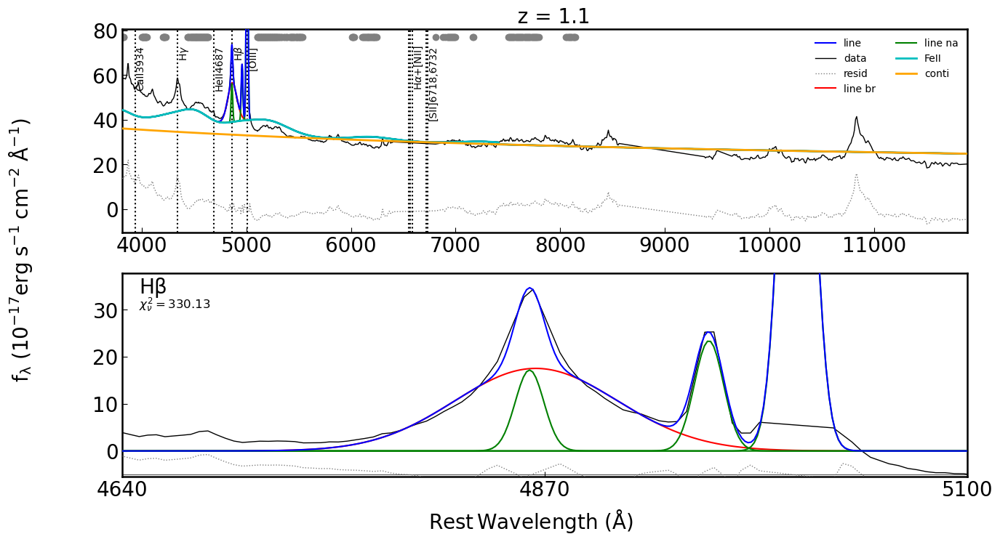

In [112]:
#EXAMPLE USAGE
kings_horses = KingsHorses()
redshift = 1.1
magnitude = 15
integration_time = 3600  # seconds
#TESTS
# PLOTTING = True   #plots every single plot for debugging
# PLOTTING = False
# PLOT_LAST_ONLY = True   #just plots the final results

kings_horses.source_test('optical_nir_qso_sed_001.fits', magnitude, redshift, integration_time)
kings_horses.pyqsofitting()
snr_in_j = kings_horses.sig_to_noise_bands('J', results = True)



Fitting quasar with mag 14.0 at redshift 1.1 with exposure time 3600s

Source of mag: 14.0 exposure: 3600 redshift :1.1 has been fully ground and processed!

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None     True     None     None
Fe_op_norm          0        0    1e+10     None     True     None     None
Fe_op_shift         0    -0.01     0.01     None     True     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_uv_norm          0        0    1e+10     None    False     None     None
Fe_uv_shift         0    -0.01     0.01     None    False     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_s

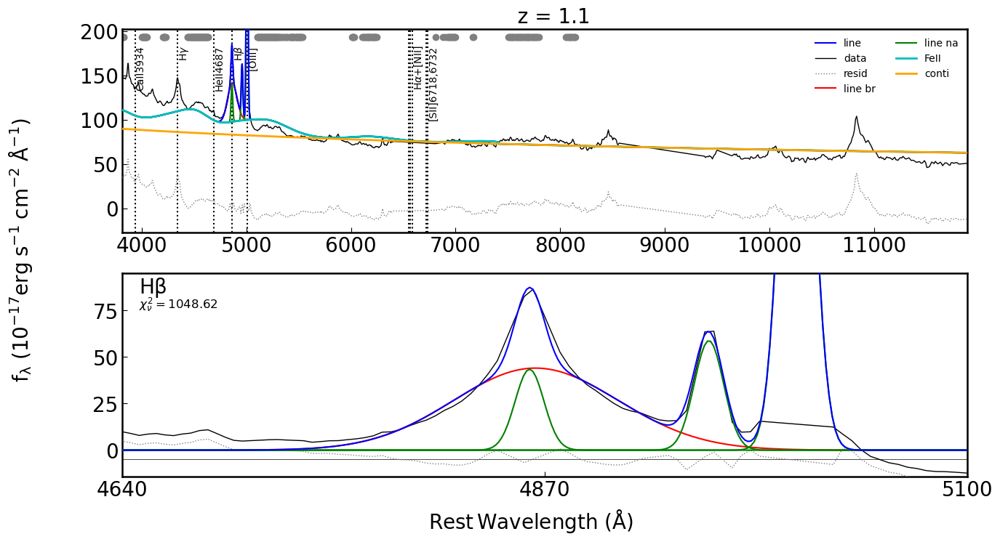

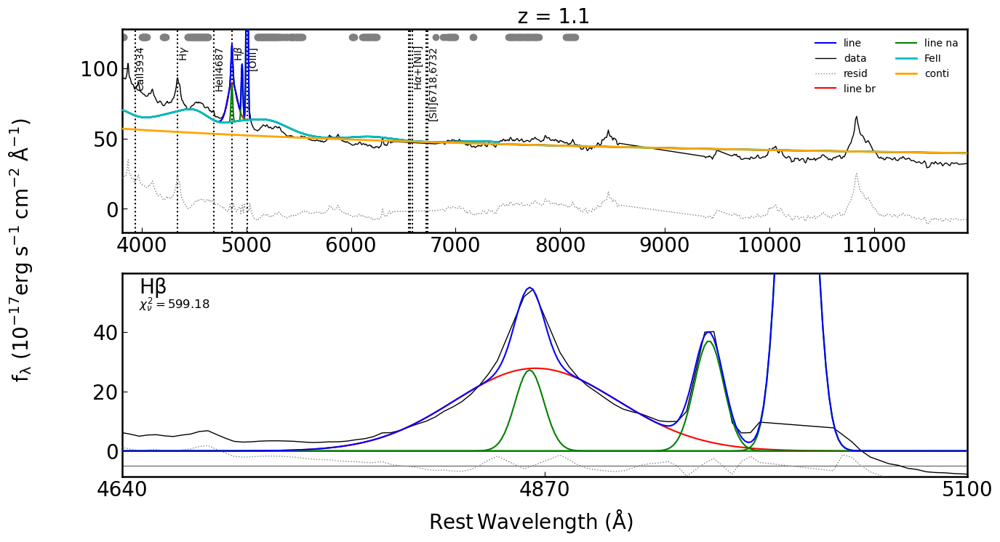

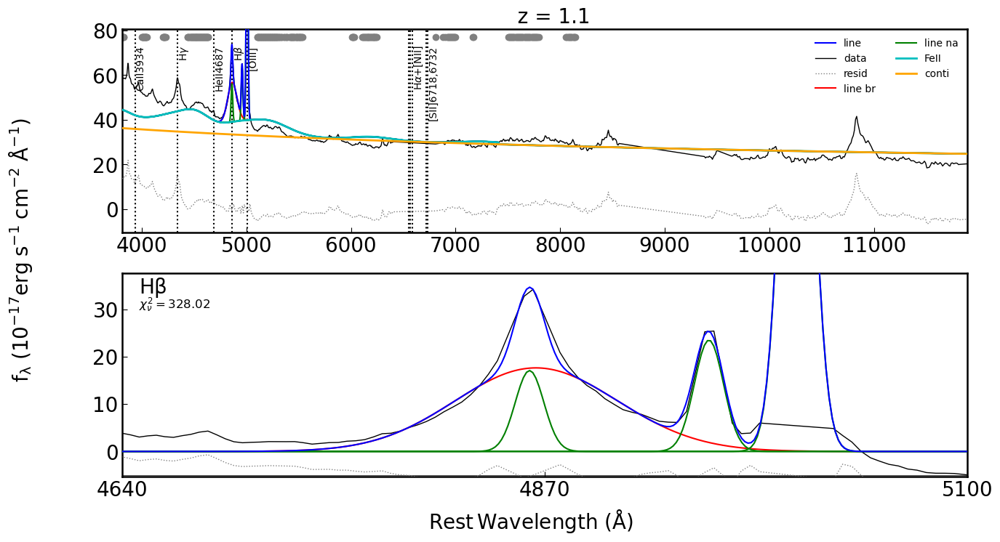

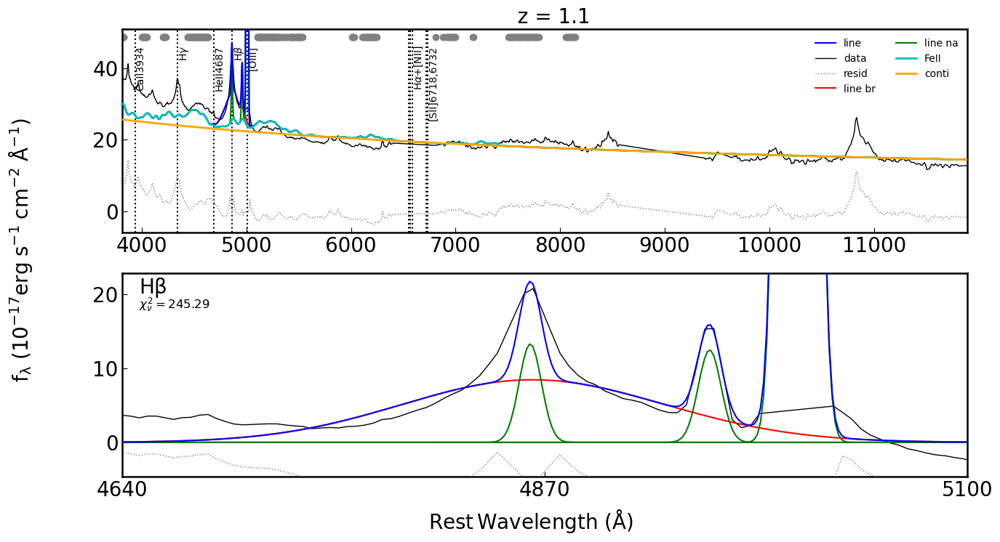

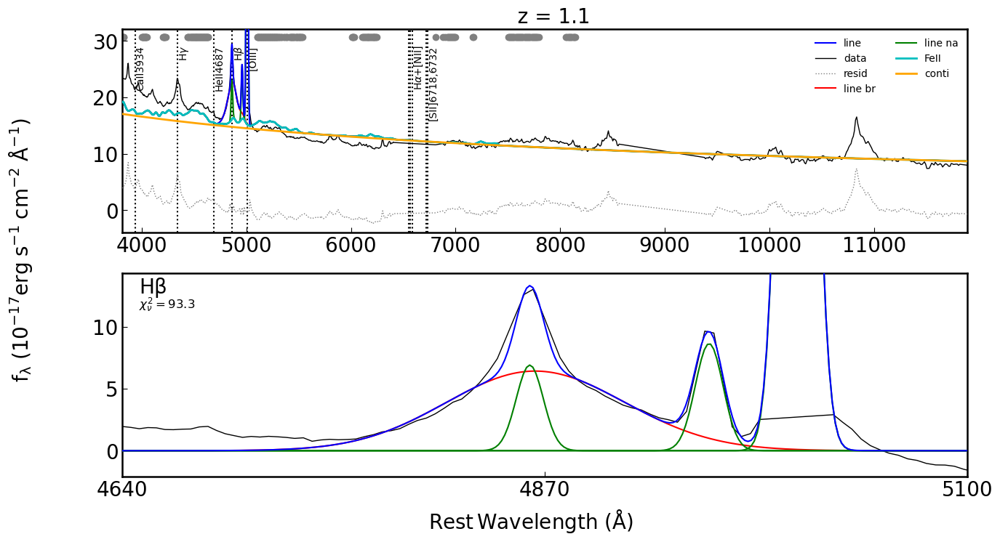

...

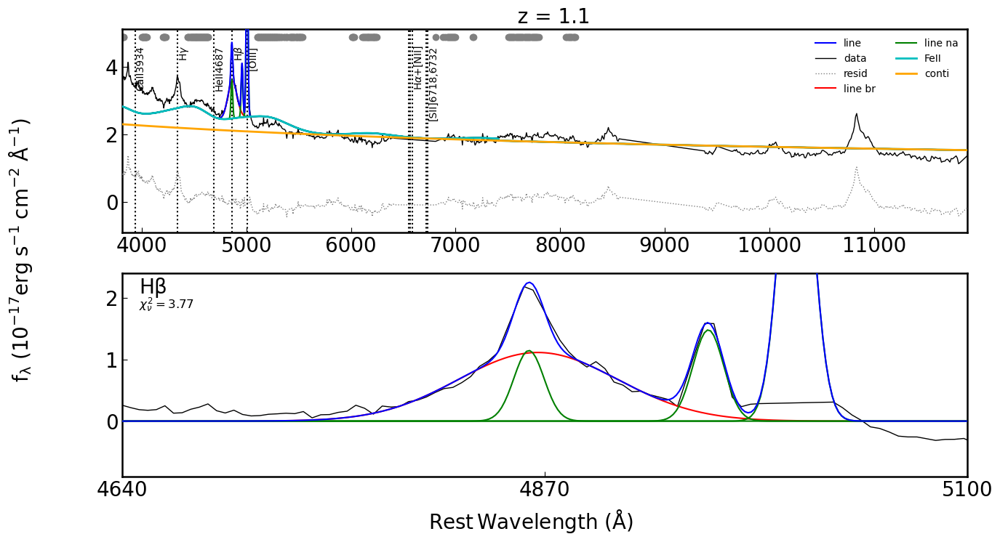

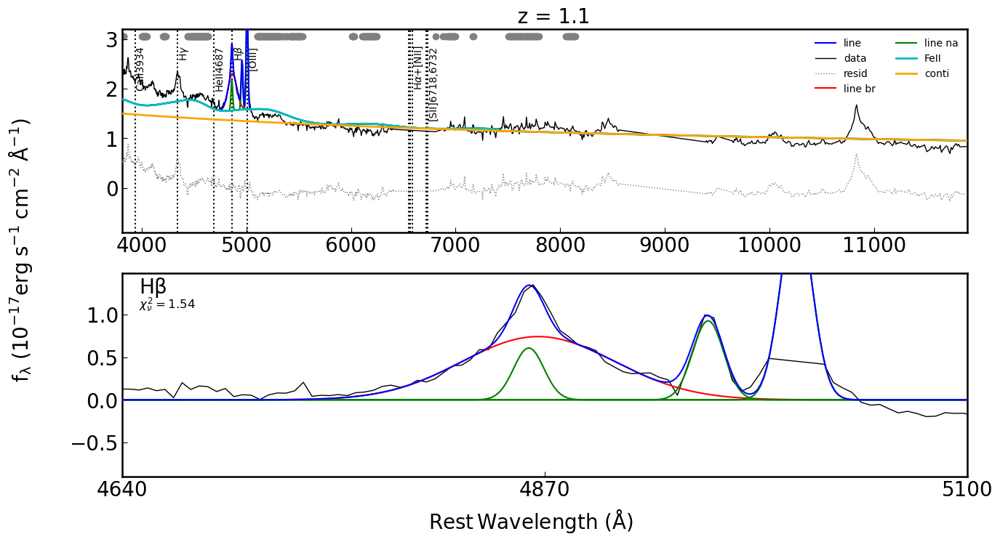

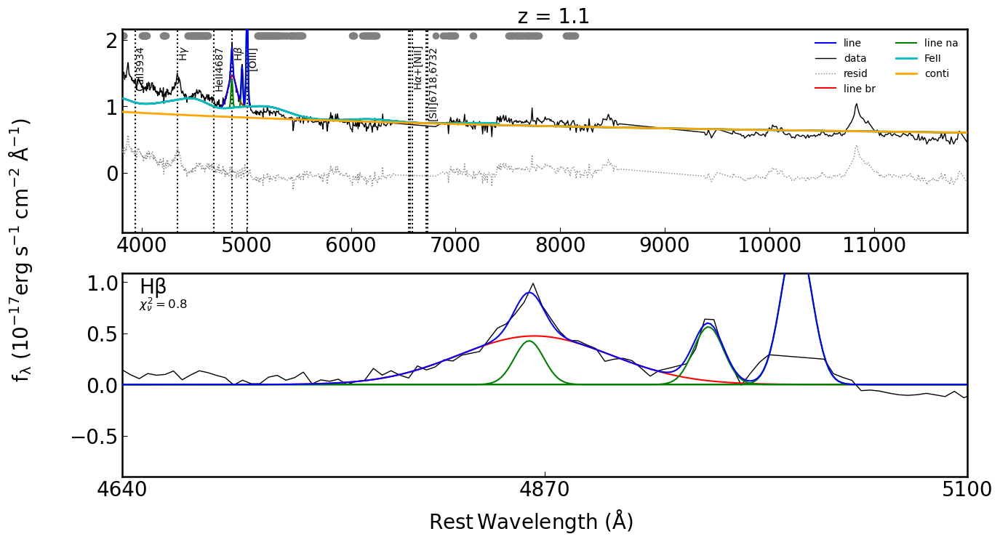

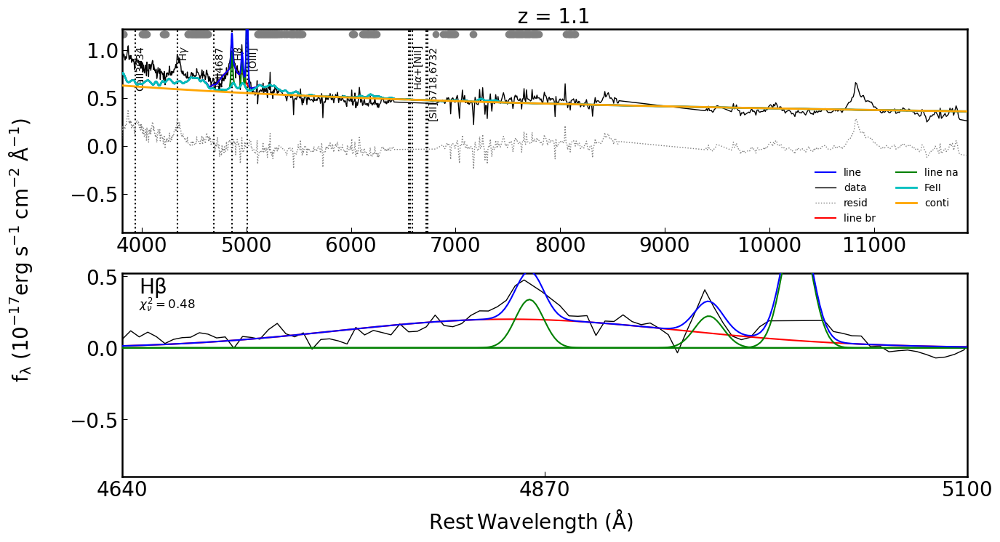

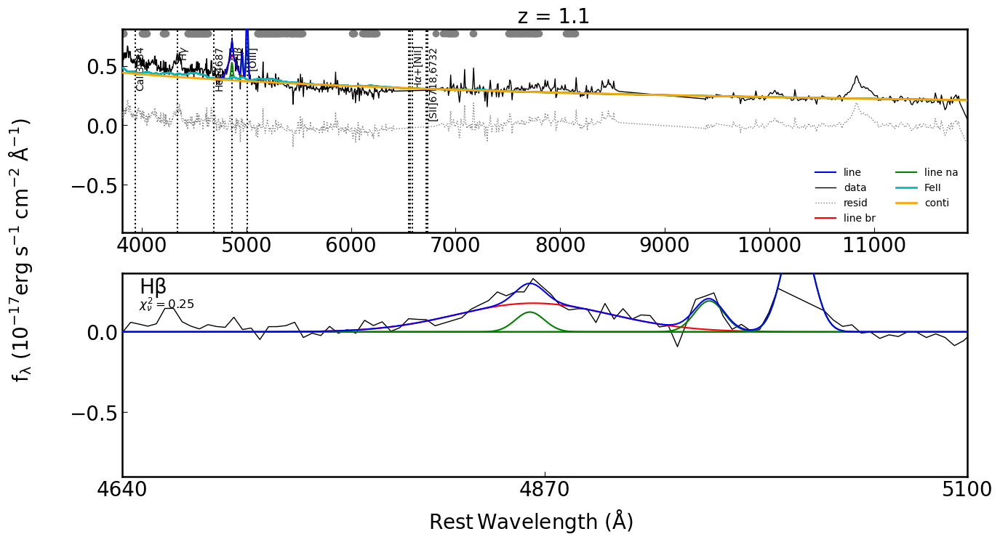

In [113]:
#Example -- Going over a variety of quasars and fitting the H beta line
kingsmen = KingsMen()
hb_component_fits = kingsmen.fit_quasars_for_hb(iterations = 1)

Fitting quasar with mag 8 at redshift 0.5 with exposure time 3600s

Source of mag: 8 exposure: 3600 redshift :0.5 has been fully ground and processed!

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_op_norm          0        0    1e+10     None    False     None     None
Fe_op_shift         0    -0.01     0.01     None    False     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_uv_norm          0        0    1e+10     None    False     None     None
Fe_uv_shift         0    -0.01     0.01     None    False     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope  

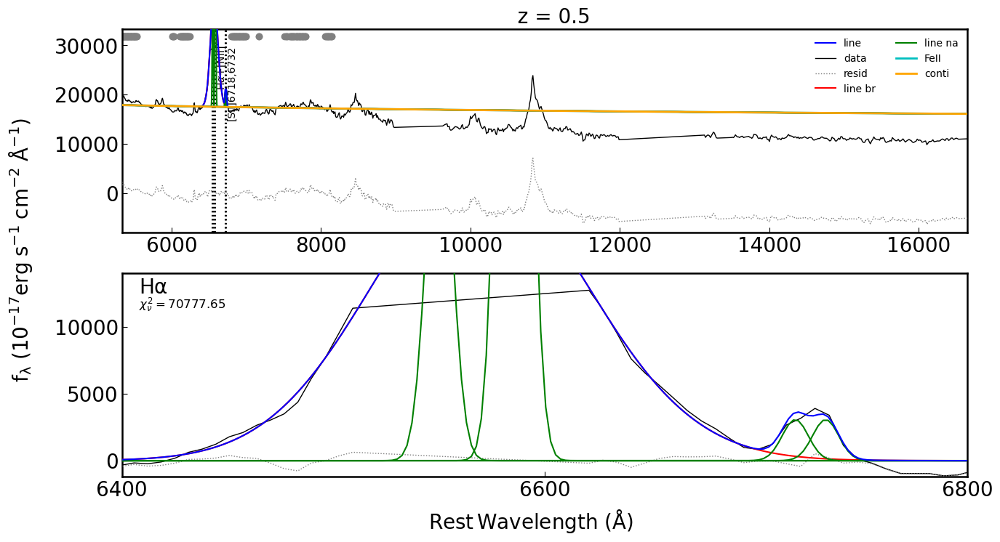

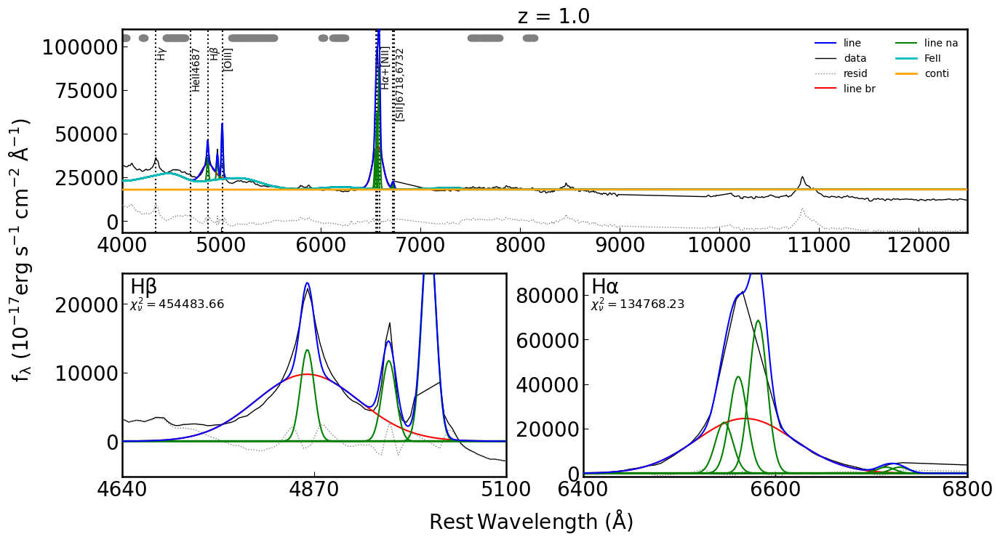

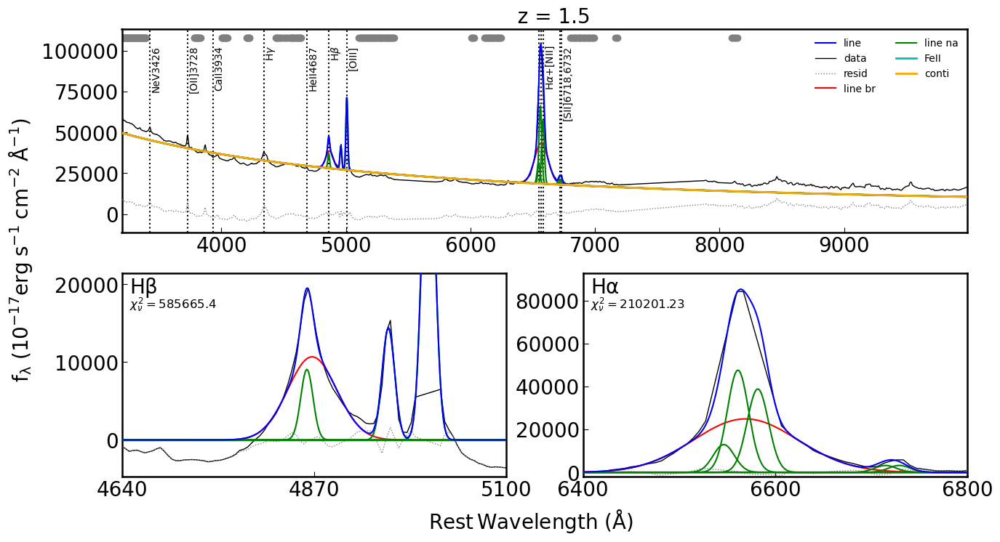

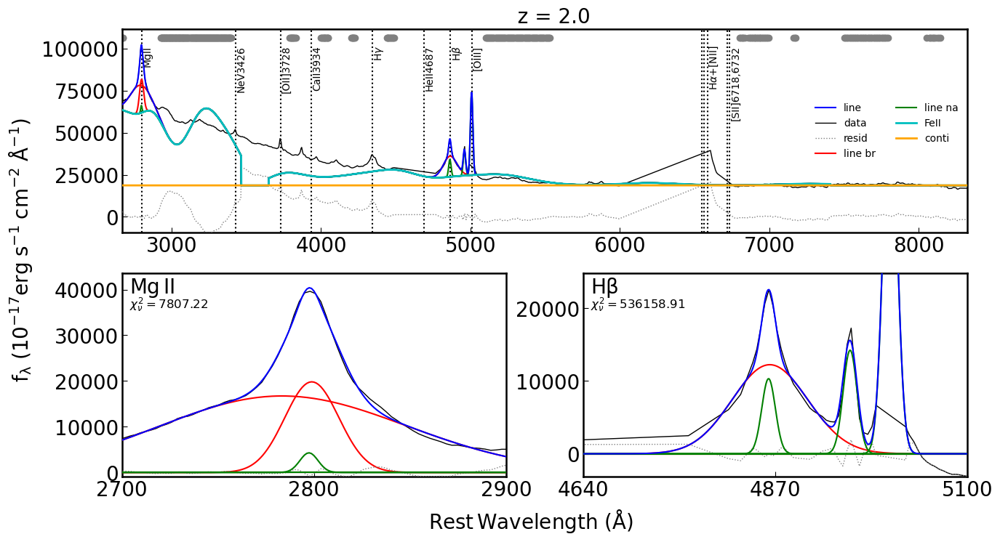

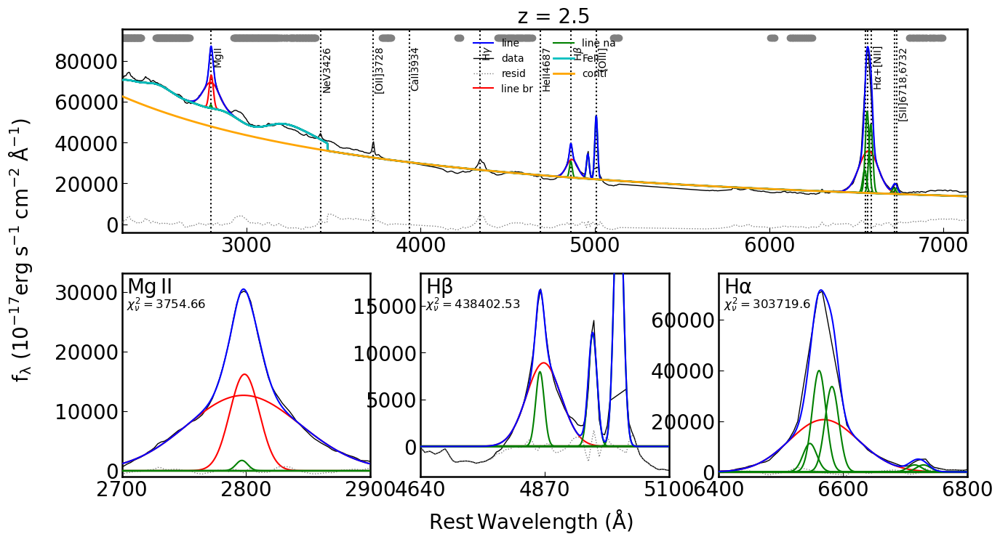

...

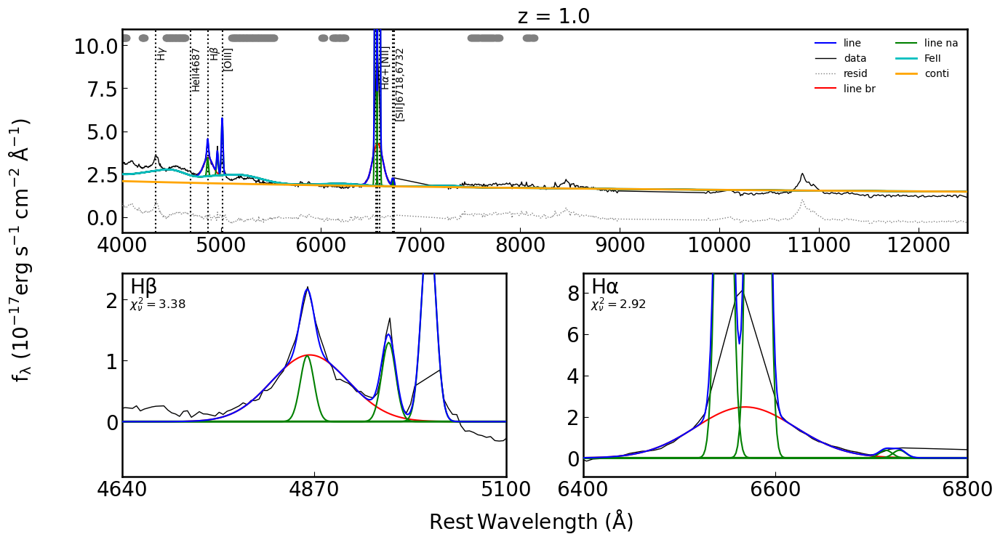

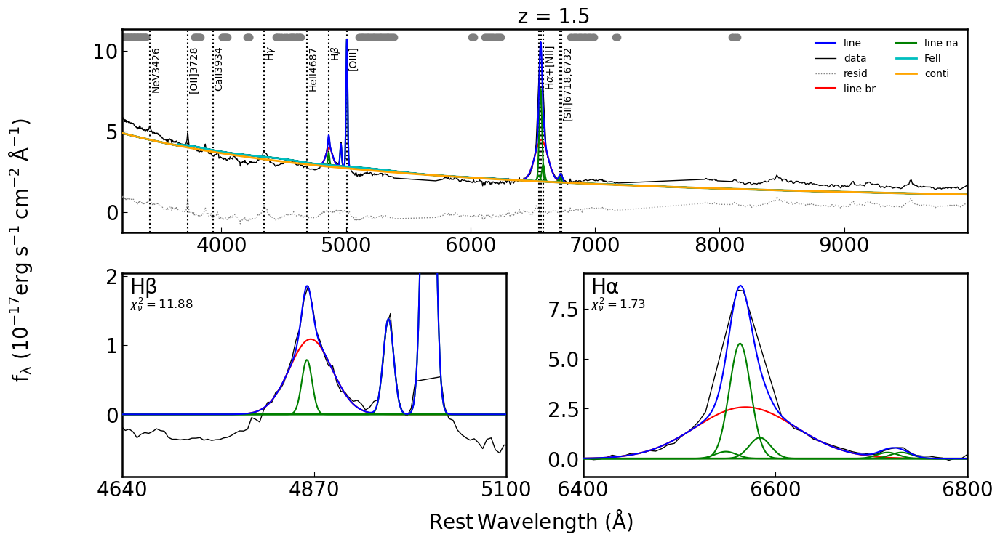

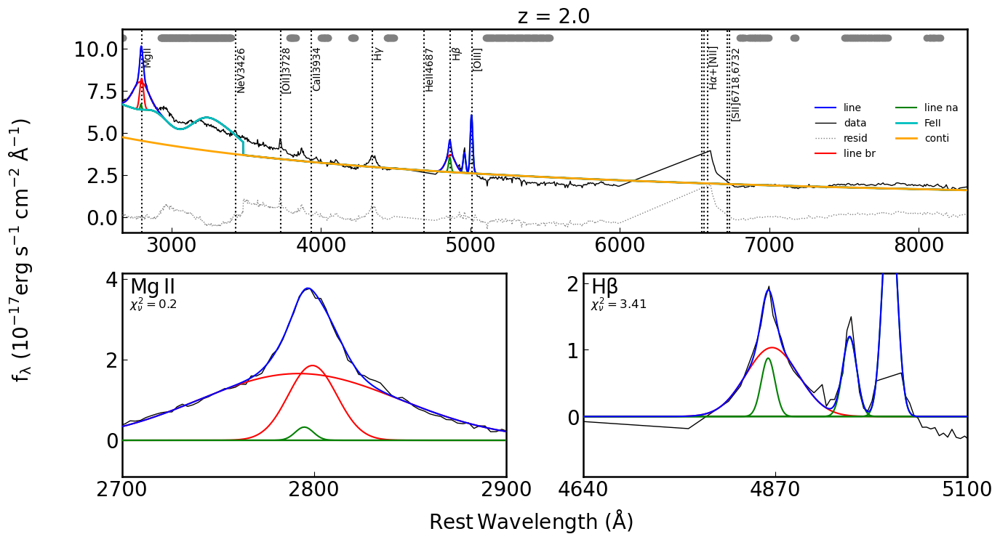

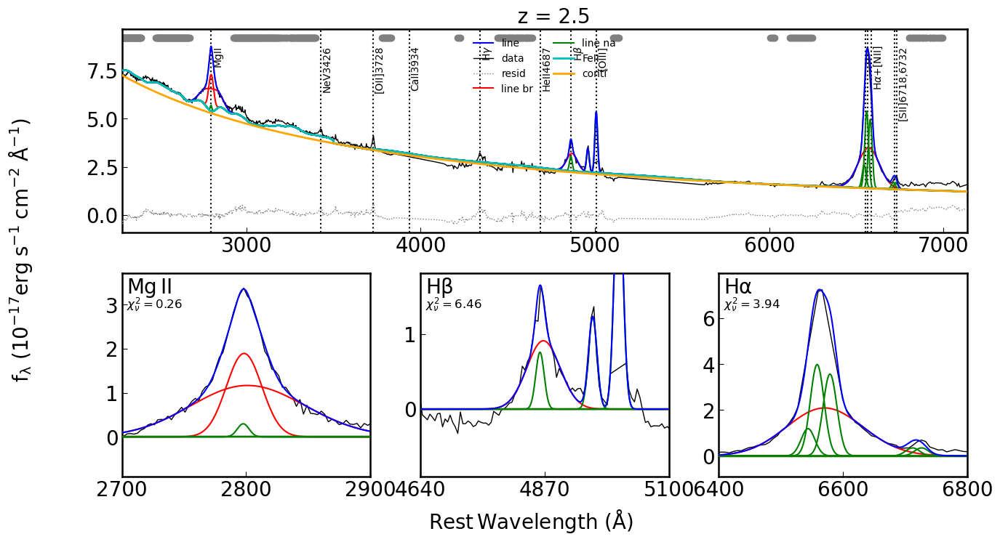

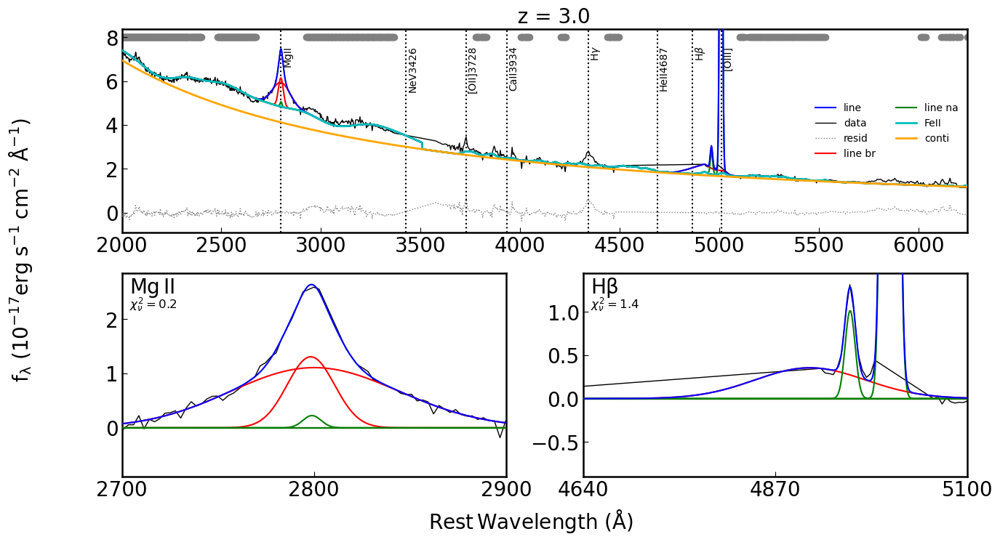

In [114]:
kingsmen.fit_some_quasars()